# Using Dimension Reductionality

In [1]:
#Importing python libraries which help us speed our coding up.
#The packages we're importing are below.
import pandas as pd
import random
from pandas.plotting import scatter_matrix
import scipy as sc
import numpy as np
import matplotlib
import matplotlib.pyplot as plt 
import sklearn as sk
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn import datasets, linear_model

In [8]:
%ls

Uma_Dimension_Reductionality.ipynb


In [9]:
#We will now read the data in and store it in a dataframe called dataset
dataset = pd.read_excel('../git_data/NHAMCS_ER_Data.xlsx', header = 0)

In [7]:
# checking the percentage of missing values in each variable
x = dataset.isnull().sum()/len(dataset)*100

In [5]:
x[:50]

SERIALNO        0.000000
VMONTH          0.000000
VDAYR           0.000000
ARRTIME         0.000000
WAITTIME       16.217188
AGE             0.000000
AGEDAYS         0.000000
RESIDNCE        0.842451
SEX             0.000000
RACERETH        0.000000
ARREMS          0.606154
AMBTRANSFER    85.483125
PAYTYPER        0.000000
TEMPF           6.734474
PULSE           7.761853
RESPR           5.296142
BPSYS          10.977552
BPDIAS         11.095700
POPCT           7.854318
IMMEDR          2.953717
PAINSCALE       3.164329
SEEN72          1.556480
RFV1            0.148970
RFV2           35.691170
RFV3           61.776339
RFV4           78.419890
RFV5           88.698824
EPISODE         0.513690
INJURY          0.200339
INJPOISAD       0.200339
INJURY72       75.327477
INTENT15       65.788257
INJURY_ENC     72.389171
ETOHAB          0.000000
ALZHD           0.000000
ASTHMA          0.000000
CANCER          0.000000
CEBVD           0.000000
CKD             0.000000
COPD            0.000000


In [88]:
x[50:100]

HTN            0.000000
OBESITY        0.000000
OSA            0.000000
OSTPRSIS       0.000000
SUBSTAB        0.000000
NOCHRON        1.248266
TOTCHRON       1.248266
OPIOID_PRES    0.000000
dtype: float64

In [89]:
x[100:150]

Series([], dtype: float64)

#### Understanding our data
Let's run some code and see how many rows and columns we have. Below - you will see the result as (Number of Rows, Number of Columns)

In [90]:
dataset.shape

(19467, 58)

#### What do the first 10 rows of our data look like? 

In [91]:
dataset.head(10)

,SERIALNO,VMONTH,VDAYR,ARRTIME,WAITTIME,AGE,AGEDAYS,RESIDNCE,SEX,RACERETH,...,EDHIV,HYPLIPID,HTN,OBESITY,OSA,OSTPRSIS,SUBSTAB,NOCHRON,TOTCHRON,OPIOID_PRES
0,0,January,Sunday,2359,0.0,35,One year or more,Private residence,Female,Non-Hispanic Other,...,No,No,No,No,No,No,No,Yes,0.0,0
1,1,October,Thursday,1711,NaN,23,One year or more,Private residence,Female,Non-Hispanic Black,...,No,No,No,No,No,No,No,Yes,0.0,0
2,2,January,Saturday,1134,NaN,37,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
3,3,July,Tuesday,1105,NaN,73,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,No,1.0,0
4,4,March,Monday,1934,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,Yes,No,1.0,0
5,5,January,Friday,1723,100.0,24,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
6,6,March,Tuesday,1003,6.0,91,One year or more,NaN,Male,Non-Hispanic White,...,No,Yes,Yes,No,No,No,No,No,5.0,3
7,7,July,Tuesday,1321,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
8,8,January,Tuesday,842,NaN,29,One year or more,Private residence,Male,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
9,9,May,Thursday,1639,144.0,14,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,No,1.0,0


In [92]:
dataset.var()

SERIALNO       3.158196e+07
ARRTIME        3.695713e+05
WAITTIME       4.671827e+03
TEMPF          9.797118e-01
RESPR          4.119588e+01
BPSYS          5.696047e+02
BPDIAS         2.192455e+02
POPCT          3.917613e+01
TOTCHRON       2.396470e+00
OPIOID_PRES    1.576032e+00
dtype: float64

In [93]:
clean_df = dataset

In [94]:
clean_df = clean_df.replace(['Blank', "Not applicable", "Entire item blank, including 'None' box", "'None' box and all item fields are blank", "Not Applicable"], 
                     [None, None, None, None, None ]) 


In [95]:
clean_df.head()

,SERIALNO,VMONTH,VDAYR,ARRTIME,WAITTIME,AGE,AGEDAYS,RESIDNCE,SEX,RACERETH,...,EDHIV,HYPLIPID,HTN,OBESITY,OSA,OSTPRSIS,SUBSTAB,NOCHRON,TOTCHRON,OPIOID_PRES
0,0,January,Sunday,2359,0.0,35,One year or more,Private residence,Female,Non-Hispanic Other,...,No,No,No,No,No,No,No,Yes,0.0,0
1,1,October,Thursday,1711,NaN,23,One year or more,Private residence,Female,Non-Hispanic Black,...,No,No,No,No,No,No,No,Yes,0.0,0
2,2,January,Saturday,1134,NaN,37,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
3,3,July,Tuesday,1105,NaN,73,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,No,1.0,0
4,4,March,Monday,1934,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,Yes,No,1.0,0


In [96]:
clean_df_age = clean_df

In [97]:
clean_df_age['AGE'] = clean_df['AGE'].replace(['round(random.uniform(0,1), N)'])

In [98]:
clean_df_age['AGE'] = clean_df_age['AGE'].apply(lambda v: 0 if v == 'Under one year' else v)

In [99]:
clean_df_age.head(10)

,SERIALNO,VMONTH,VDAYR,ARRTIME,WAITTIME,AGE,AGEDAYS,RESIDNCE,SEX,RACERETH,...,EDHIV,HYPLIPID,HTN,OBESITY,OSA,OSTPRSIS,SUBSTAB,NOCHRON,TOTCHRON,OPIOID_PRES
0,0,January,Sunday,2359,0.0,35,One year or more,Private residence,Female,Non-Hispanic Other,...,No,No,No,No,No,No,No,Yes,0.0,0
1,1,October,Thursday,1711,NaN,23,One year or more,Private residence,Female,Non-Hispanic Black,...,No,No,No,No,No,No,No,Yes,0.0,0
2,2,January,Saturday,1134,NaN,37,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
3,3,July,Tuesday,1105,NaN,73,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,No,1.0,0
4,4,March,Monday,1934,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,Yes,No,1.0,0
5,5,January,Friday,1723,100.0,24,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
6,6,March,Tuesday,1003,6.0,91,One year or more,NaN,Male,Non-Hispanic White,...,No,Yes,Yes,No,No,No,No,No,5.0,3
7,7,July,Tuesday,1321,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
8,8,January,Tuesday,842,NaN,29,One year or more,Private residence,Male,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
9,9,May,Thursday,1639,144.0,14,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,No,1.0,0


In [100]:
clean_df.head(10)

,SERIALNO,VMONTH,VDAYR,ARRTIME,WAITTIME,AGE,AGEDAYS,RESIDNCE,SEX,RACERETH,...,EDHIV,HYPLIPID,HTN,OBESITY,OSA,OSTPRSIS,SUBSTAB,NOCHRON,TOTCHRON,OPIOID_PRES
0,0,January,Sunday,2359,0.0,35,One year or more,Private residence,Female,Non-Hispanic Other,...,No,No,No,No,No,No,No,Yes,0.0,0
1,1,October,Thursday,1711,NaN,23,One year or more,Private residence,Female,Non-Hispanic Black,...,No,No,No,No,No,No,No,Yes,0.0,0
2,2,January,Saturday,1134,NaN,37,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
3,3,July,Tuesday,1105,NaN,73,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,No,1.0,0
4,4,March,Monday,1934,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,Yes,No,1.0,0
5,5,January,Friday,1723,100.0,24,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
6,6,March,Tuesday,1003,6.0,91,One year or more,NaN,Male,Non-Hispanic White,...,No,Yes,Yes,No,No,No,No,No,5.0,3
7,7,July,Tuesday,1321,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
8,8,January,Tuesday,842,NaN,29,One year or more,Private residence,Male,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
9,9,May,Thursday,1639,144.0,14,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,No,1.0,0


In [101]:
clean_df_age['AGE'].value_counts()

0                    539
1                    456
22                   340
26                   339
2                    338
23                   327
21                   321
25                   321
28                   320
24                   314
29                   311
19                   307
30                   304
27                   303
32                   297
33                   294
34                   283
31                   280
36                   280
37                   275
52                   271
20                   268
53                   266
35                   266
39                   265
3                    260
49                   260
46                   259
45                   253
50                   252
                    ... 
12                   162
10                   159
9                    159
66                   147
67                   143
73                   139
74                   135
13                   135
71                   130


In [102]:
clean_df['AGE'] 

0        35
1        23
2        37
3        73
4        30
5        24
6        91
7        30
8        29
9        14
10       68
11       29
12        5
13       28
14        6
15       69
16       75
17        2
18       27
19       40
20       74
21        9
22       26
23       19
24       45
25        0
26        9
27       16
28       33
29       39
         ..
19437    25
19438    46
19439    20
19440    47
19441    68
19442    62
19443    61
19444    43
19445    29
19446    33
19447    26
19448    22
19449    46
19450    60
19451    91
19452    59
19453    72
19454    39
19455    26
19456    65
19457    28
19458    22
19459    18
19460    17
19461    27
19462    18
19463    23
19464     0
19465    49
19466    36
Name: AGE, Length: 19467, dtype: object

In [103]:
clean_df.isna().sum()

SERIALNO           0
VMONTH             0
VDAYR              0
ARRTIME            0
WAITTIME        3157
AGE                0
AGEDAYS            0
RESIDNCE         164
SEX                0
RACERETH           0
ARREMS           118
AMBTRANSFER    16641
PAYTYPER           0
TEMPF           1311
PULSE           1511
RESPR           1031
BPSYS           2137
BPDIAS          2160
POPCT           1529
IMMEDR           575
PAINSCALE        616
SEEN72           303
RFV1              29
RFV2            6948
RFV3           12026
RFV4           15266
RFV5           17267
EPISODE          100
INJURY            39
INJPOISAD         39
INJURY72       14664
INTENT15       12807
INJURY_ENC     14092
ETOHAB             0
ALZHD              0
ASTHMA             0
CANCER             0
CEBVD              0
CKD                0
COPD               0
CHF                0
CAD                0
DEPRN              0
DIABTYP1           0
DIABTYP2           0
DIABTYP0           0
ESRD               0
HPE          

In [105]:
clean_df.head(25)

,SERIALNO,VMONTH,VDAYR,ARRTIME,WAITTIME,AGE,AGEDAYS,RESIDNCE,SEX,RACERETH,...,EDHIV,HYPLIPID,HTN,OBESITY,OSA,OSTPRSIS,SUBSTAB,NOCHRON,TOTCHRON,OPIOID_PRES
0,0,January,Sunday,2359,0.0,35,One year or more,Private residence,Female,Non-Hispanic Other,...,No,No,No,No,No,No,No,Yes,0.0,0
1,1,October,Thursday,1711,NaN,23,One year or more,Private residence,Female,Non-Hispanic Black,...,No,No,No,No,No,No,No,Yes,0.0,0
2,2,January,Saturday,1134,NaN,37,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
3,3,July,Tuesday,1105,NaN,73,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,No,1.0,0
4,4,March,Monday,1934,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,Yes,No,1.0,0
5,5,January,Friday,1723,100.0,24,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
6,6,March,Tuesday,1003,6.0,91,One year or more,NaN,Male,Non-Hispanic White,...,No,Yes,Yes,No,No,No,No,No,5.0,3
7,7,July,Tuesday,1321,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
8,8,January,Tuesday,842,NaN,29,One year or more,Private residence,Male,Non-Hispanic White,...,No,No,No,No,No,No,No,Yes,0.0,0
9,9,May,Thursday,1639,144.0,14,One year or more,Private residence,Female,Non-Hispanic White,...,No,No,No,No,No,No,No,No,1.0,0


In [106]:
clean_df['ETOHAB'] = clean_df['ETOHAB'].apply(lambda x: 0 if x=='No' else 1)

In [107]:
clean_df['ALZHD'] = clean_df['ALZHD'].apply(lambda x: 0 if x=='No' else 1)

In [108]:
clean_df['ASTHMA'] = clean_df['ASTHMA'].apply(lambda x: 0 if x=='No' else 1)
clean_df['CANCER'] = clean_df['CANCER'].apply(lambda x: 0 if x=='No' else 1)
clean_df['CEBVD'] = clean_df['CEBVD'].apply(lambda x: 0 if x=='No' else 1)
clean_df['CKD'] = clean_df['CKD'].apply(lambda x: 0 if x=='No' else 1)
clean_df['COPD'] = clean_df['COPD'].apply(lambda x: 0 if x=='No' else 1)
clean_df['CHF'] = clean_df['CHF'].apply(lambda x: 0 if x=='No' else 1)
clean_df['CAD'] = clean_df['CAD'].apply(lambda x: 0 if x=='No' else 1)
clean_df['DEPRN'] = clean_df['DEPRN'].apply(lambda x: 0 if x=='No' else 1)
clean_df['DIABTYP1'] = clean_df['DIABTYP1'].apply(lambda x: 0 if x=='No' else 1)
clean_df['DIABTYP2'] = clean_df['DIABTYP2'].apply(lambda x: 0 if x=='No' else 1)
clean_df['DIABTYP0'] = clean_df['DIABTYP0'].apply(lambda x: 0 if x=='No' else 1)
clean_df['ESRD'] = clean_df['ESRD'].apply(lambda x: 0 if x=='No' else 1)
clean_df['HPE'] = clean_df['HPE'].apply(lambda x: 0 if x=='No' else 1)
clean_df['EDHIV'] = clean_df['EDHIV'].apply(lambda x: 0 if x=='No' else 1)
clean_df['HYPLIPID'] = clean_df['HYPLIPID'].apply(lambda x: 0 if x=='No' else 1)
clean_df['HTN'] = clean_df['HTN'].apply(lambda x: 0 if x=='No' else 1)
clean_df['OBESITY'] = clean_df['OBESITY'].apply(lambda x: 0 if x=='No' else 1)
clean_df['OSA'] = clean_df['OSA'].apply(lambda x: 0 if x=='No' else 1)
clean_df['OSTPRSIS'] = clean_df['OSTPRSIS'].apply(lambda x: 0 if x=='No' else 1)
clean_df['SUBSTAB'] = clean_df['SUBSTAB'].apply(lambda x: 0 if x=='No' else 1)
clean_df['NOCHRON'] = clean_df['NOCHRON'].apply(lambda x: 0 if x=='No' else 1)

In [109]:
clean_df['OPIOID_PRES'] = clean_df['OPIOID_PRES'].apply(lambda x: 1 if x==3 else 0)

In [110]:
clean_df.head(15)

,SERIALNO,VMONTH,VDAYR,ARRTIME,WAITTIME,AGE,AGEDAYS,RESIDNCE,SEX,RACERETH,...,EDHIV,HYPLIPID,HTN,OBESITY,OSA,OSTPRSIS,SUBSTAB,NOCHRON,TOTCHRON,OPIOID_PRES
0,0,January,Sunday,2359,0.0,35,One year or more,Private residence,Female,Non-Hispanic Other,...,0,0,0,0,0,0,0,1,0.0,0
1,1,October,Thursday,1711,NaN,23,One year or more,Private residence,Female,Non-Hispanic Black,...,0,0,0,0,0,0,0,1,0.0,0
2,2,January,Saturday,1134,NaN,37,One year or more,Private residence,Female,Non-Hispanic White,...,0,0,0,0,0,0,0,1,0.0,0
3,3,July,Tuesday,1105,NaN,73,One year or more,Private residence,Female,Non-Hispanic White,...,0,0,0,0,0,0,0,0,1.0,0
4,4,March,Monday,1934,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,0,0,0,0,0,0,1,0,1.0,0
5,5,January,Friday,1723,100.0,24,One year or more,Private residence,Female,Non-Hispanic White,...,0,0,0,0,0,0,0,1,0.0,0
6,6,March,Tuesday,1003,6.0,91,One year or more,NaN,Male,Non-Hispanic White,...,0,1,1,0,0,0,0,0,5.0,1
7,7,July,Tuesday,1321,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,0,0,0,0,0,0,0,1,0.0,0
8,8,January,Tuesday,842,NaN,29,One year or more,Private residence,Male,Non-Hispanic White,...,0,0,0,0,0,0,0,1,0.0,0
9,9,May,Thursday,1639,144.0,14,One year or more,Private residence,Female,Non-Hispanic White,...,0,0,0,0,0,0,0,0,1.0,0


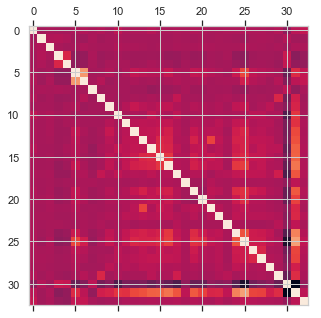

In [112]:
import itertools
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

plt.matshow(clean_df.corr())
plt.show()

%matplotlib inline

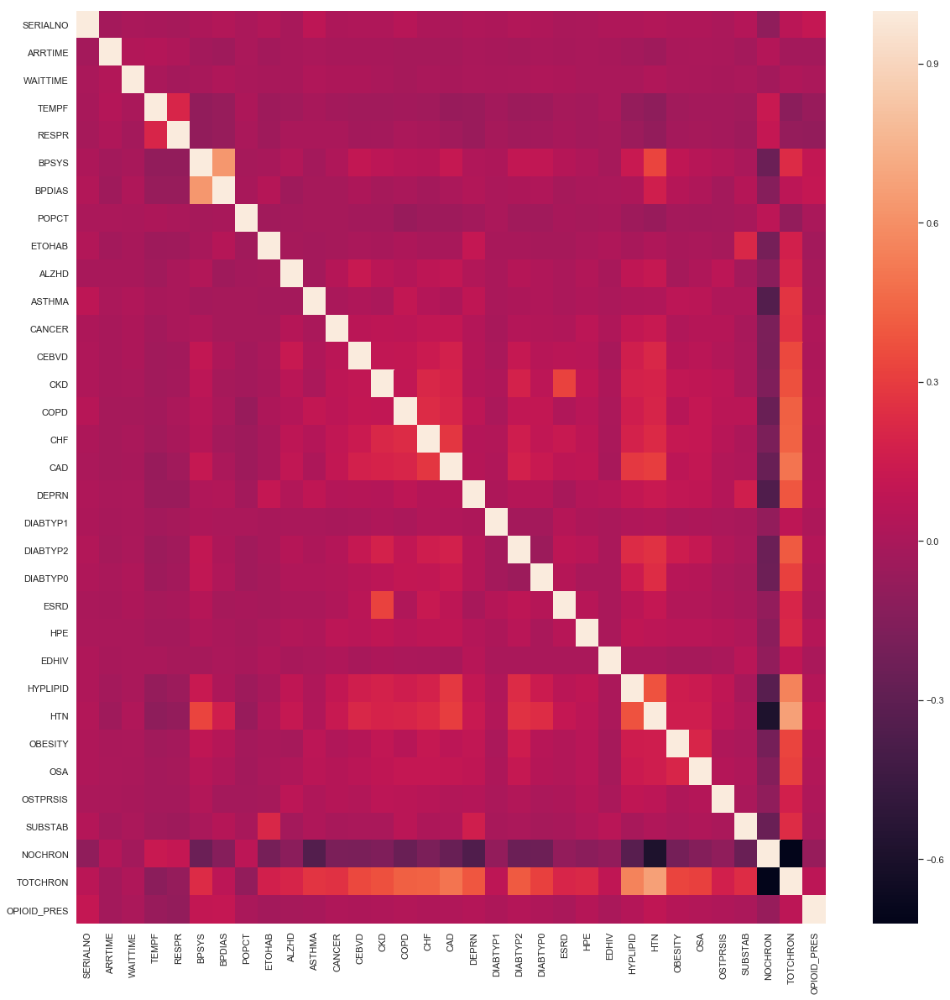

In [113]:
plt.figure(figsize=(20, 20))

corr = clean_df.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [114]:
features = ['ETOHAB', 'ALZHD', 'ASTHMA', 'CANCER', 'CEBVD', 'CKD', 'COPD', 'CHF', 'CAD', 'DEPRN', 'DIABTYP1', 'DIABTYP2', 'DIABTYP0', 'ESRD', 'HPE', 'EDHIV', 'HYPLIPID', 'HTN', 'OBESITY', 'OSA', 'OSTPRSIS', 'SUBSTAB', 'NOCHRON']   
#Age, race, # total chronic conditions, pain level, sex, RACERETH, IMMEDR (use these variables in the regression as well)
#Create a model - predicting pain levels with other variables
#Add another model for variables 
#Add another model for wait time
#Change the age variable - make infants less than 1year 0 and over 93 a random number between 93-100
#Regression with pain level as dependent variable
#New visualization like above with pain 
#logistic regression out put with weights

X = clean_df[features]
y = clean_df['OPIOID_PRES']  

In [115]:
import sklearn
import sklearn.tree
from sklearn.model_selection import train_test_split
# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

# Create a decision tree classifier model using scikit-learn
classifier = sklearn.tree.DecisionTreeClassifier()

# Train the decision tree classifier
classifier.fit(X_train, y_train)



DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [116]:
# Use the trained classifier to make predictions on the test data
y_pred = classifier.predict(X_test)

# Print the accuracy (percentage of phishing websites correctly predicted)
accuracy = 100.0 * sklearn.metrics.accuracy_score(y_test, y_pred)
print("The accuracy of your decision tree on testing data is: " + str(accuracy))

The accuracy of your decision tree on testing data is: 73.6517719568567


In [117]:
import graphviz 

graphviz.Source(sklearn.tree.export_graphviz(classifier,
                                             feature_names=features,
                                             class_names=['OpioidNotPrescribed', 'OpioidPrescribed'],
                                             out_file=None,
                                             filled = True))

In [118]:
clean_df.head()

,SERIALNO,VMONTH,VDAYR,ARRTIME,WAITTIME,AGE,AGEDAYS,RESIDNCE,SEX,RACERETH,...,EDHIV,HYPLIPID,HTN,OBESITY,OSA,OSTPRSIS,SUBSTAB,NOCHRON,TOTCHRON,OPIOID_PRES
0,0,January,Sunday,2359,0.0,35,One year or more,Private residence,Female,Non-Hispanic Other,...,0,0,0,0,0,0,0,1,0.0,0
1,1,October,Thursday,1711,NaN,23,One year or more,Private residence,Female,Non-Hispanic Black,...,0,0,0,0,0,0,0,1,0.0,0
2,2,January,Saturday,1134,NaN,37,One year or more,Private residence,Female,Non-Hispanic White,...,0,0,0,0,0,0,0,1,0.0,0
3,3,July,Tuesday,1105,NaN,73,One year or more,Private residence,Female,Non-Hispanic White,...,0,0,0,0,0,0,0,0,1.0,0
4,4,March,Monday,1934,NaN,30,One year or more,Private residence,Female,Non-Hispanic White,...,0,0,0,0,0,0,1,0,1.0,0


In [119]:
clean_df["SEX_Binary"] = ""

In [120]:
#Change gender to numeric
clean_df['SEX_Binary'] = clean_df['SEX'].apply(lambda x: 0 if x=="Male" else 1)

In [121]:
clean_df['SEX_Binary'].value_counts()

1    10575
0     8892
Name: SEX_Binary, dtype: int64

In [122]:
#Change pain level unknown to negative value
clean_df['PAINSCALE_clean'] = ""

In [123]:
clean_df['PAINSCALE'] = clean_df['PAINSCALE'].replace(['Unknown'], [-1])

In [124]:
clean_df['PAINSCALE'].head()

0     5.0
1    -1.0
2     NaN
3    -1.0
4    10.0
Name: PAINSCALE, dtype: float64

In [125]:
def race_to_numeric(x):
    if x=='Hispanic':
        return 0
    if x=='Non-Hispanic Black':
        return 1
    if x=='Non-Hispanic Other':
        return 2
    if x=='Non-Hispanic White':
        return 3

In [126]:
clean_df['race_num'] = ""

In [127]:
clean_df['race_num'] = clean_df['RACERETH'].apply(race_to_numeric)

In [128]:
clean_df['race_num'].value_counts()

3    11490
1     4270
0     2878
2      829
Name: race_num, dtype: int64

In [129]:
def immedr_to_numeric(x):
    if x=='Unknown':
        return 0
    if x=='Visit occurred in ESA that does not conduct nursing triage':
        return 1
    if x=='No triage for this visit but ESA does conduct triage':
        return 1
    if x=='Nonurgent':
        return 2
    if x=='Semi-urgent':
        return 3
    if x=='Urgent':
        return 4
    if x=='Emergent':
        return 5

In [130]:
clean_df['immedr_num'].value_counts()

KeyError: 'immedr_num'

In [131]:
clean_df['immedr_num'] = ""

In [132]:
clean_df['immedr_num'] = clean_df['IMMEDR'].apply(immedr_to_numeric)

In [133]:
clean_df['immedr_num'].value_counts()

4.0    6526
3.0    4795
0.0    3518
1.0    1560
5.0    1530
2.0     859
Name: immedr_num, dtype: int64

In [134]:
small_df = clean_df[['AGE', 'SEX_Binary', 'race_num', 'immedr_num', 'TOTCHRON', 'PAINSCALE', 'OPIOID_PRES']]

In [135]:
%ls

UMA_CLEAN.csv                       Uma_Dataset_NHAMCS_2016.xlsx
UMA_CLEAN_binary.csv                Uma_Dimension_Reductionality.ipynb
UMA_Clean_2.xlsx                    Uma_Final_Dataset.csv


In [136]:
small_df.head()

,AGE,SEX_Binary,race_num,immedr_num,TOTCHRON,PAINSCALE,OPIOID_PRES
0,35,1,2,4.0,0.0,5.0,0
1,23,1,1,1.0,0.0,-1.0,0
2,37,1,3,NaN,0.0,NaN,0
3,73,1,3,0.0,1.0,-1.0,0
4,30,1,3,3.0,1.0,10.0,0


In [137]:
filtered_data = small_df[small_df["AGE"]=='93 years and over']

In [138]:
filtered_data

,AGE,SEX_Binary,race_num,immedr_num,TOTCHRON,PAINSCALE,OPIOID_PRES
78,93 years and over,1,2,4.0,3.0,0.0,0
490,93 years and over,1,3,3.0,2.0,3.0,0
1010,93 years and over,1,3,4.0,5.0,2.0,0
1076,93 years and over,0,3,4.0,2.0,-1.0,0
1103,93 years and over,1,3,3.0,0.0,6.0,0
1324,93 years and over,0,3,4.0,4.0,0.0,0
1492,93 years and over,1,0,0.0,2.0,-1.0,0
1501,93 years and over,1,3,0.0,1.0,-1.0,0
1563,93 years and over,1,3,1.0,3.0,-1.0,0
1588,93 years and over,1,3,1.0,2.0,2.0,0


In [139]:
small_df = small_df.replace(['93 years and over'], [random.uniform(93,100)])

In [140]:
small_df.head()

,AGE,SEX_Binary,race_num,immedr_num,TOTCHRON,PAINSCALE,OPIOID_PRES
0,35.0,1,2,4.0,0.0,5.0,0
1,23.0,1,1,1.0,0.0,-1.0,0
2,37.0,1,3,NaN,0.0,NaN,0
3,73.0,1,3,0.0,1.0,-1.0,0
4,30.0,1,3,3.0,1.0,10.0,0


In [141]:
small_df.corr()

,AGE,SEX_Binary,race_num,immedr_num,TOTCHRON,PAINSCALE,OPIOID_PRES
AGE,1.000000,0.030554,0.194624,0.085748,0.538085,0.088788,0.150426
SEX_Binary,0.030554,1.000000,0.002332,-0.003179,-0.001858,0.062347,0.035867
race_num,0.194624,0.002332,1.000000,0.039777,0.096291,0.011935,0.064293
immedr_num,0.085748,-0.003179,0.039777,1.000000,0.097548,0.218575,0.055003
TOTCHRON,0.538085,-0.001858,0.096291,0.097548,1.000000,0.001555,0.078360
PAINSCALE,0.088788,0.062347,0.011935,0.218575,0.001555,1.000000,0.335363
OPIOID_PRES,0.150426,0.035867,0.064293,0.055003,0.078360,0.335363,1.000000


In [176]:
plt.figure(figsize=(15, 15))
corr_small = small_df.corr()
corr_small.style.background_gradient(cmap='coolwarm')

# plot the heatmap
#sns.heatmap(corr_small, 
#        xticklabels=corr_small.columns,
#        yticklabels=corr_small.columns)

#Add actual values of correlation to each square DONE
#Where is age? Change age data type DONE

,AGE,SEX_Binary,race_num,immedr_num,TOTCHRON,PAINSCALE,OPIOID_PRES
AGE,1,0.0305542,0.194624,0.0857482,0.538085,0.0887885,0.150426
SEX_Binary,0.0305542,1,0.00233236,-0.00317942,-0.00185823,0.062347,0.0358672
race_num,0.194624,0.00233236,1,0.0397765,0.0962913,0.0119354,0.0642933
immedr_num,0.0857482,-0.00317942,0.0397765,1,0.0975478,0.218575,0.0550029
TOTCHRON,0.538085,-0.00185823,0.0962913,0.0975478,1,0.00155471,0.07836
PAINSCALE,0.0887885,0.062347,0.0119354,0.218575,0.00155471,1,0.335363
OPIOID_PRES,0.150426,0.0358672,0.0642933,0.0550029,0.07836,0.335363,1


<Figure size 1080x1080 with 0 Axes>

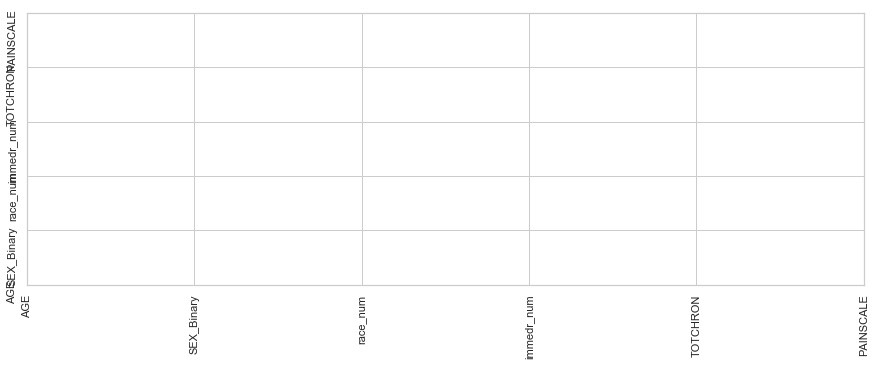

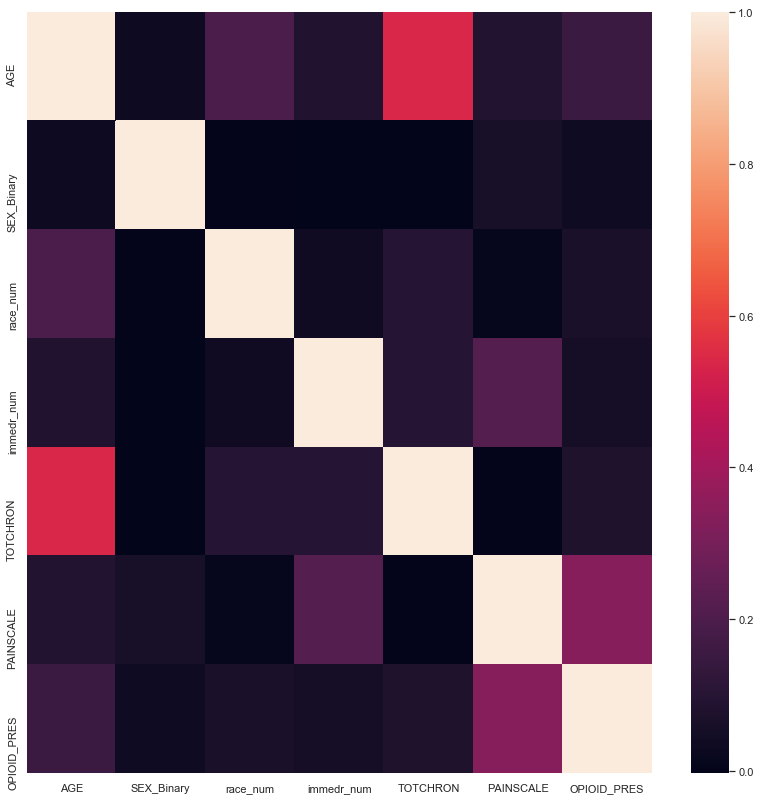

In [170]:
corr_small_no_num = small_df.corr()
corr_small_no_num.style.background_gradient(cmap='coolwarm')
fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_xticklabels(corr_small_no_num.columns, rotation=90)
ax.set_yticklabels(corr_small_no_num.columns, rotation=90)
plt.figure(figsize=(14, 14))
# plot the heatmap
sns.heatmap(corr_small, 
        xticklabels=corr_small_no_num.columns,
        yticklabels=corr_small_no_num.columns)
plt.savefig('Corr_Matrix_No_Num.png')

<Figure size 1800x1440 with 0 Axes>

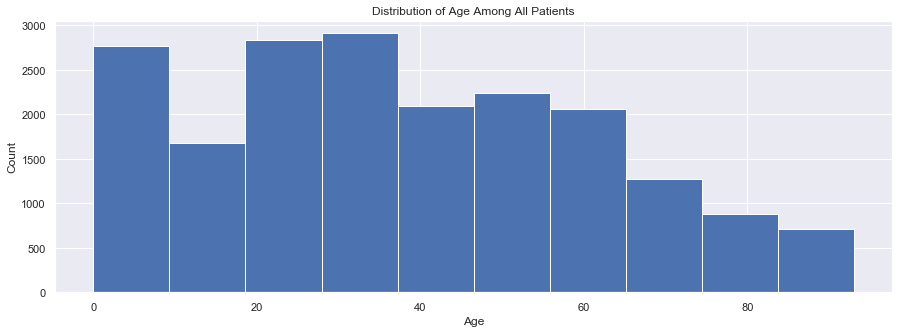

<Figure size 1800x1440 with 0 Axes>

In [195]:
small_df.hist(column='AGE')
plt.xlabel('Age')
plt.ylabel('Count')
plt.title("Distribution of Age Among All Patients")
plt.figure(figsize=(25, 20))



<Figure size 1800x1440 with 0 Axes>

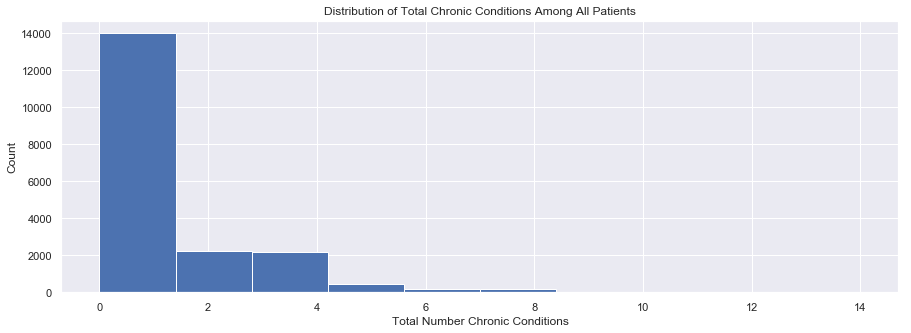

<Figure size 1800x1440 with 0 Axes>

In [196]:
small_df.hist(column='TOTCHRON')
plt.xlabel('Total Number Chronic Conditions')
plt.ylabel('Count')
plt.title("Distribution of Total Chronic Conditions Among All Patients")
plt.figure(figsize=(25, 20))



In [191]:
ax = sns.distplot(small_df, x = 'TOTCHRON')

TypeError: distplot() got an unexpected keyword argument 'x'

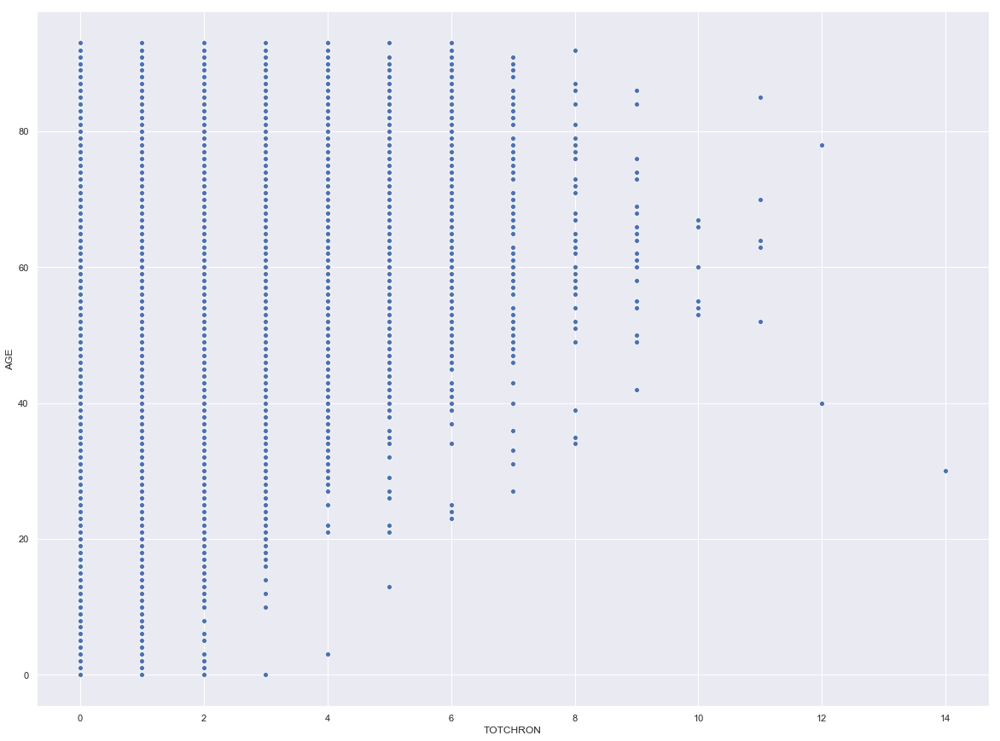

In [188]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 15))
ax = sns.scatterplot(x='TOTCHRON', y = 'AGE', data = small_df)

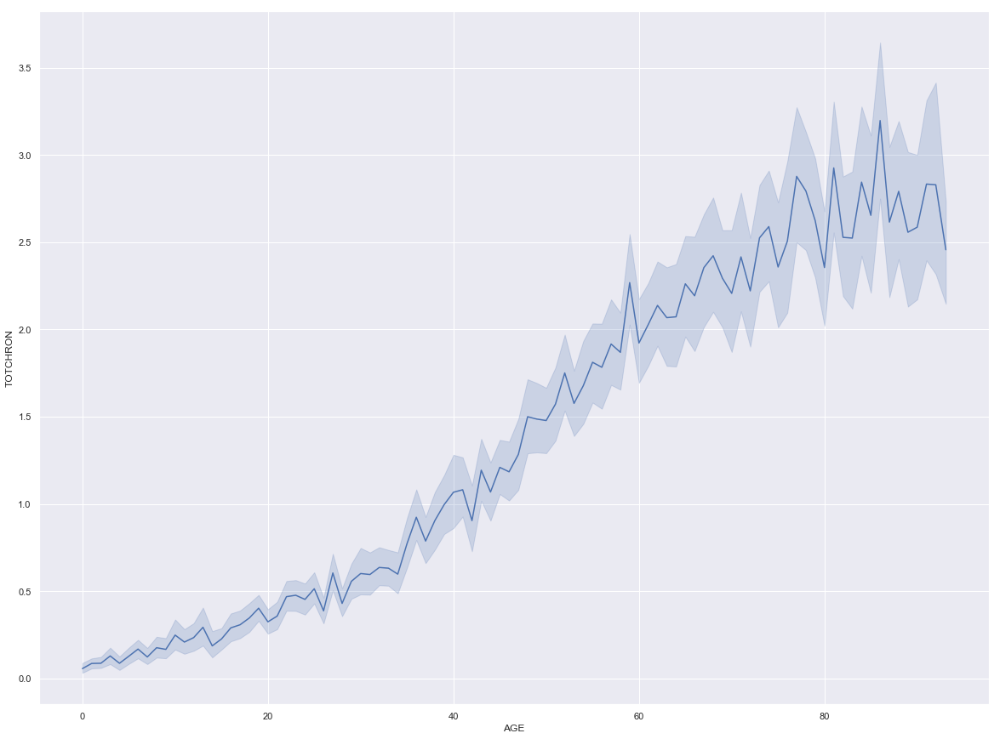

In [205]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 15))
ax = sns.lineplot(x ='AGE', y = 'TOTCHRON', data = small_df)

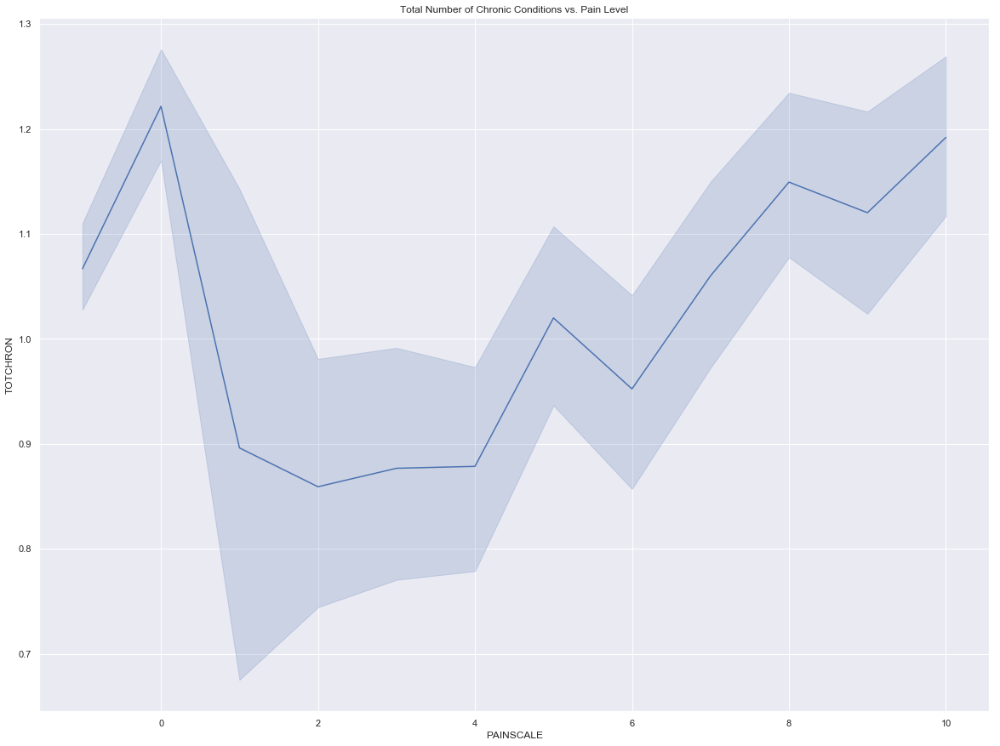

In [265]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 15))
plt.title('Total Number of Chronic Conditions vs. Pain Level')
ax = sns.lineplot(x ='PAINSCALE', y = 'TOTCHRON', data = small_df)

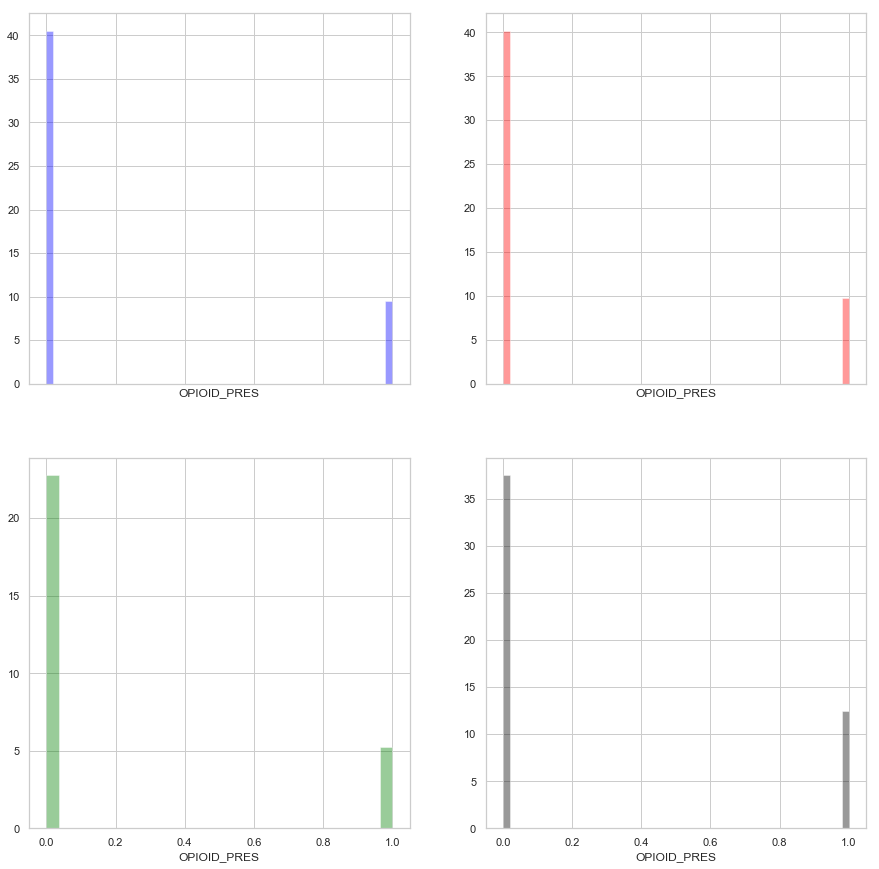

In [254]:
#TWO LOGISTIC REGRESSIONS 
##whether opioid is prescribed or not, and we woulsd be using all variables (main factor is pain)
##immediacy as a function of pain (control for everything else)\
### DECISION TREE
f, axes = plt.subplots(2, 2, figsize=(15, 15), sharex=True)

sns.distplot(type0, color='blue', label='Hispanic', kde = False, norm_hist = True, ax=axes[0, 0])
sns.distplot(type1, color='red', label='Non-Hispanic Black', kde = False, norm_hist = True, ax=axes[0, 1])
sns.distplot(type2, color='green', label='Non-Hispanic Other', kde = False, norm_hist = True, ax=axes[1, 0])
sns.distplot(type3, color='black', label='Non-Hispanic White', kde = False, norm_hist = True, ax=axes[1, 1])


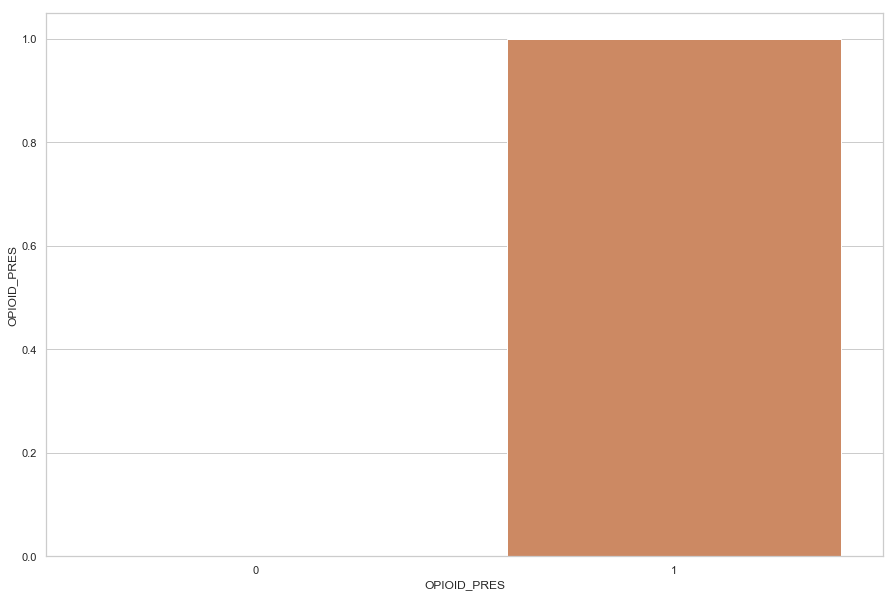

In [257]:
a = small_df.columns
sns.barplot(x="OPIOID_PRES", y=type0, data=small_df)
plt.show()

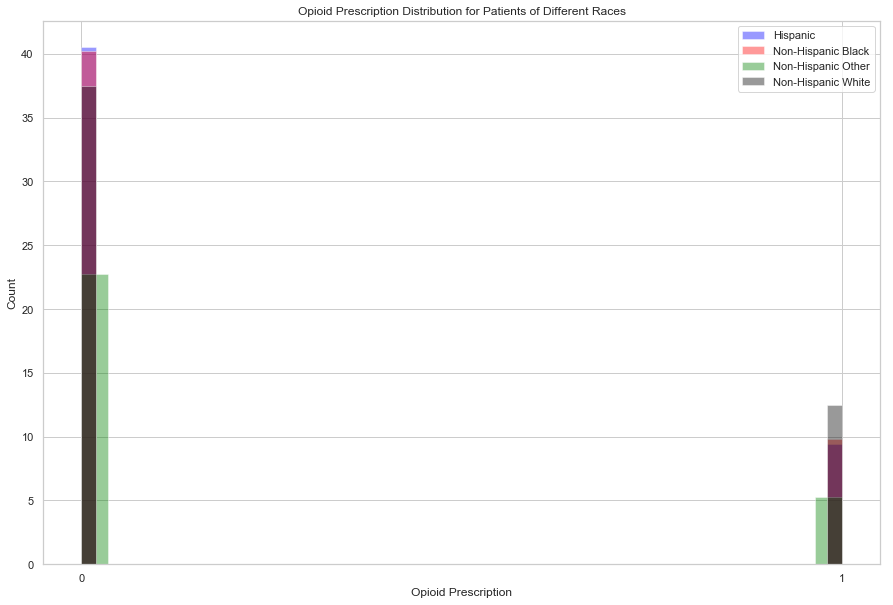

In [248]:
import matplotlib.ticker as ticker
type0 = small_df[small_df['race_num']==0]['OPIOID_PRES']
type1 = small_df[small_df['race_num']==1]['OPIOID_PRES']
type2 = small_df[small_df['race_num']==2]['OPIOID_PRES']
type3 = small_df[small_df['race_num']==3]['OPIOID_PRES']

sns.distplot(type0, color='blue', label='Hispanic', kde = False, norm_hist = True)
sns.distplot(type1, color='red', label='Non-Hispanic Black', kde = False, norm_hist = True)
sns.distplot(type2, color='green', label='Non-Hispanic Other', kde = False, norm_hist = True)
sns.distplot(type3, color='black', label='Non-Hispanic White', kde = False, norm_hist = True)

ax.xaxis.set_major_locator(ticker.MultipleLocator(0.5))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter(0.5))
plt.xticks(np.arange(0, 1.5, 1))

plt.title("Opioid Prescription Distribution for Patients of Different Races")
plt.xlabel('Opioid Prescription')
plt.ylabel('Count')
sns.set(style="whitegrid")
plt.legend(loc='upper right')
plt.rcParams['figure.figsize'] = [15, 10]
plt.show()

In [267]:
small_df['PAINSCALE'].value_counts()

-1.0     5607
 0.0     3795
 10.0    1647
 8.0     1643
 7.0     1124
 5.0     1109
 6.0      968
 9.0      886
 4.0      750
 3.0      589
 2.0      579
 1.0      154
Name: PAINSCALE, dtype: int64

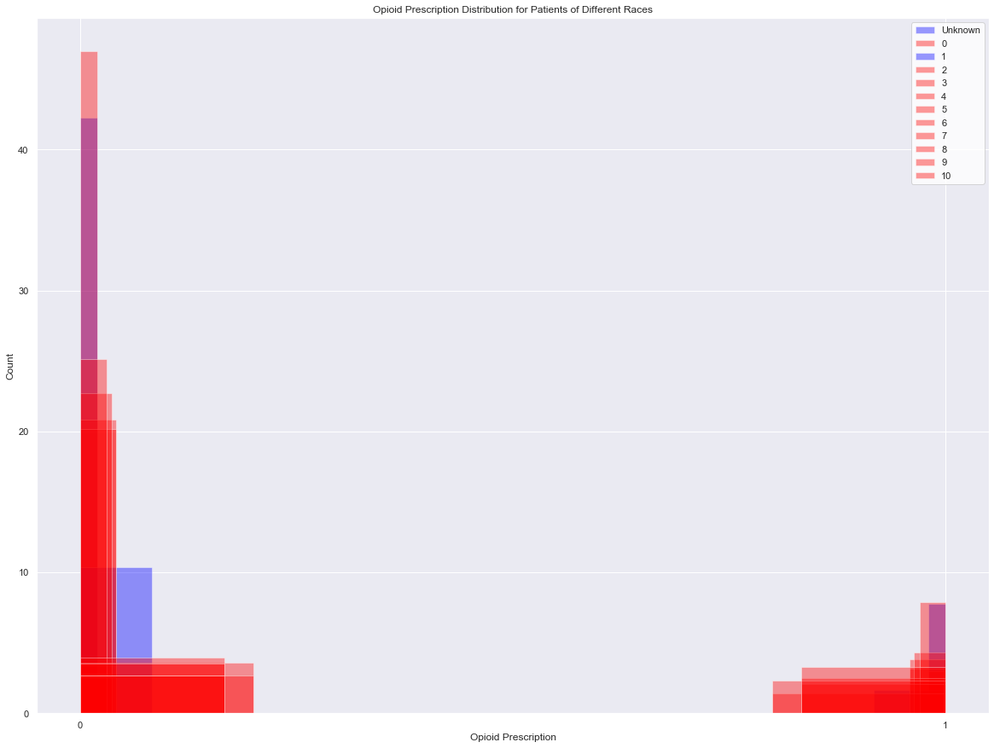

In [268]:
import matplotlib.ticker as ticker
type00 = small_df[small_df['PAINSCALE']==-1]['OPIOID_PRES']
type01 = small_df[small_df['PAINSCALE']==0]['OPIOID_PRES']
type02 = small_df[small_df['PAINSCALE']==1]['OPIOID_PRES']
type03 = small_df[small_df['PAINSCALE']==2]['OPIOID_PRES']
type04 = small_df[small_df['PAINSCALE']==3]['OPIOID_PRES']
type05 = small_df[small_df['PAINSCALE']==4]['OPIOID_PRES']
type06 = small_df[small_df['PAINSCALE']==5]['OPIOID_PRES']
type07 = small_df[small_df['PAINSCALE']==6]['OPIOID_PRES']
type08 = small_df[small_df['PAINSCALE']==7]['OPIOID_PRES']
type09 = small_df[small_df['PAINSCALE']==8]['OPIOID_PRES']
type10 = small_df[small_df['PAINSCALE']==9]['OPIOID_PRES']
type11 = small_df[small_df['PAINSCALE']==10]['OPIOID_PRES']



sns.distplot(type00, color='blue', label='Unknown', kde = False, norm_hist = True)
sns.distplot(type01, color='red', label='0', kde = False, norm_hist = True)
sns.distplot(type02, color='blue', label='1', kde = False, norm_hist = True)
sns.distplot(type03, color='red', label='2', kde = False, norm_hist = True)
sns.distplot(type04, color='red', label='3', kde = False, norm_hist = True)
sns.distplot(type05, color='red', label='4', kde = False, norm_hist = True)
sns.distplot(type06, color='red', label='5', kde = False, norm_hist = True)
sns.distplot(type07, color='red', label='6', kde = False, norm_hist = True)
sns.distplot(type08, color='red', label='7', kde = False, norm_hist = True)
sns.distplot(type09, color='red', label='8', kde = False, norm_hist = True)
sns.distplot(type10, color='red', label='9', kde = False, norm_hist = True)
sns.distplot(type11, color='red', label='10', kde = False, norm_hist = True)

ax.xaxis.set_major_locator(ticker.MultipleLocator(0.5))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter(0.5))
plt.xticks(np.arange(0, 1.5, 1))

plt.title("Opioid Prescription Distribution for Patients of Different Races")
plt.xlabel('Opioid Prescription')
plt.ylabel('Count')
sns.set(style="whitegrid")
plt.legend(loc='upper right')
plt.rcParams['figure.figsize'] = [15, 10]
plt.show()

/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:893: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


ValueError: cannot convert float NaN to integer

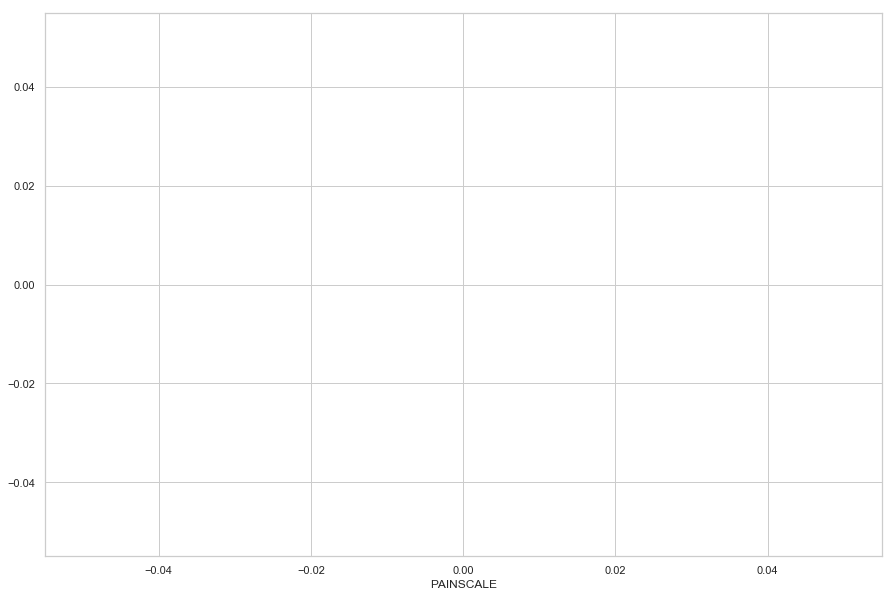

In [269]:
import matplotlib.ticker as ticker
type00 = small_df[small_df['OPIOID_PRES']==-1]['PAINSCALE']
type01 = small_df[small_df['OPIOID_PRES']==0]['PAINSCALE']

sns.distplot(type00, color='blue', label='Opioid Not Given', kde = False, norm_hist = True)
sns.distplot(type01, color='red', label='Opioid Given', kde = False, norm_hist = True)

ax.xaxis.set_major_locator(ticker.MultipleLocator(0.5))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter(0.5))
plt.xticks(np.arange(0, 1.5, 1))

plt.title("Opioid Prescription Distribution for Patients of Different Races")
plt.xlabel('Opioid Prescription')
plt.ylabel('Count')
sns.set(style="whitegrid")
plt.legend(loc='upper right')
plt.rcParams['figure.figsize'] = [15, 10]
plt.show()

In [222]:
small_df[small_df['race_num']==0]['OPIOID_PRES']

,AGE,SEX_Binary,race_num,immedr_num,TOTCHRON,PAINSCALE,OPIOID_PRES
11,29.0,1,0,4.0,2.0,-1.0,0
12,5.0,0,0,3.0,0.0,0.0,0
14,6.0,0,0,0.0,0.0,-1.0,0
16,75.0,1,0,3.0,4.0,4.0,0
37,10.0,0,0,3.0,0.0,0.0,0
45,59.0,1,0,4.0,2.0,0.0,0
52,33.0,1,0,3.0,0.0,0.0,0
54,0.0,0,0,1.0,0.0,-1.0,0
65,47.0,0,0,4.0,0.0,5.0,0
113,50.0,0,0,3.0,1.0,9.0,0


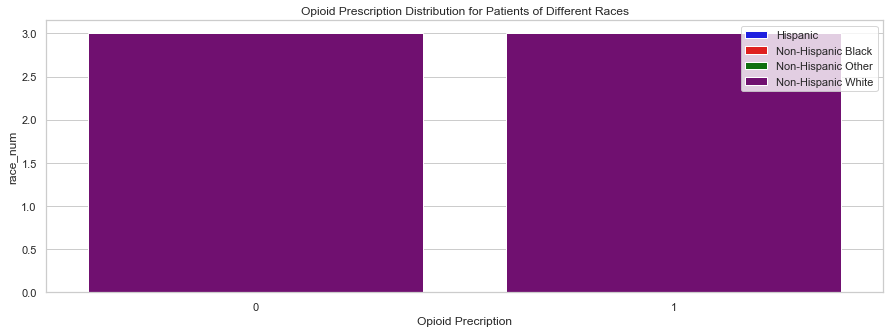

In [223]:
type0 = small_df[small_df['race_num']==0]['OPIOID_PRES']
type1 = small_df[small_df['race_num']==1]['OPIOID_PRES']
type2 = small_df[small_df['race_num']==2]['OPIOID_PRES']
type3 = small_df[small_df['race_num']==3]['OPIOID_PRES']

sns.barplot(type0, small_df[small_df['race_num']==0]['race_num'], data = small_df,  color='blue', label='Hispanic')
sns.barplot(type1, small_df[small_df['race_num']==1]['race_num'], data = small_df, color='red', label='Non-Hispanic Black')
sns.barplot(type2, small_df[small_df['race_num']==2]['race_num'], data = small_df, color='green', label='Non-Hispanic Other')
sns.barplot(type3, small_df[small_df['race_num']==3]['race_num'], data = small_df, color='purple', label='Non-Hispanic White')


plt.title("Opioid Prescription Distribution for Patients of Different Races")
plt.xlabel('Opioid Precription')

sns.set(style="whitegrid")
plt.legend(loc='upper right')
plt.rcParams['figure.figsize'] = [15, 5]

plt.show()

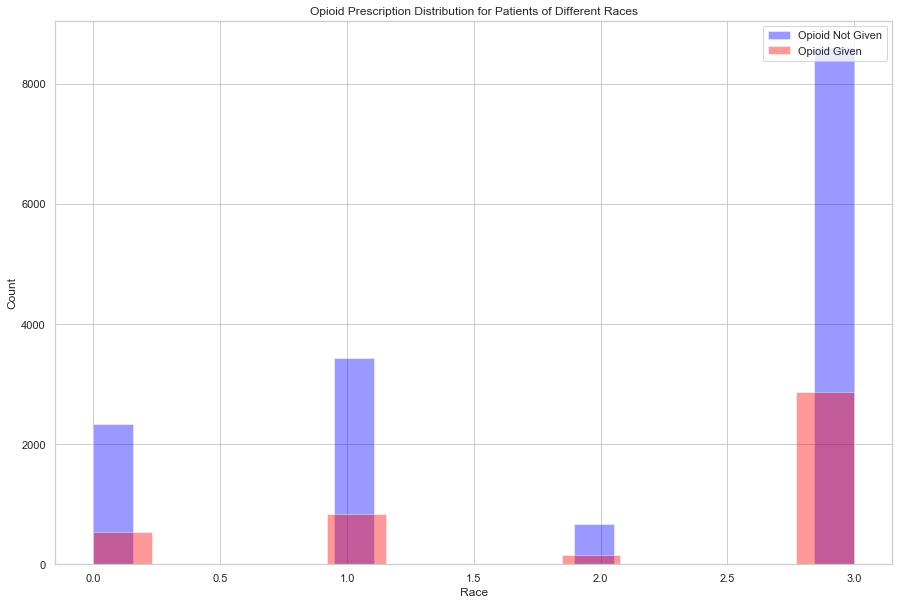

In [258]:
Opioid_Not_Given = small_df[small_df['OPIOID_PRES']==0]['race_num']
Opioid_Given = small_df[small_df['OPIOID_PRES']==1]['race_num']

sns.distplot(Opioid_Not_Given, color='blue', label='Opioid Not Given', kde = False)
sns.distplot(Opioid_Given, color='red', label='Opioid Given', kde = False)


plt.title("Opioid Prescription Distribution for Patients of Different Races")
plt.xlabel('Race')
plt.ylabel('Count')

sns.set(style="whitegrid")
plt.legend(loc='upper right')
plt.rcParams['figure.figsize'] = [15, 10]

plt.show()

#Make y axis a percentage (normalized)

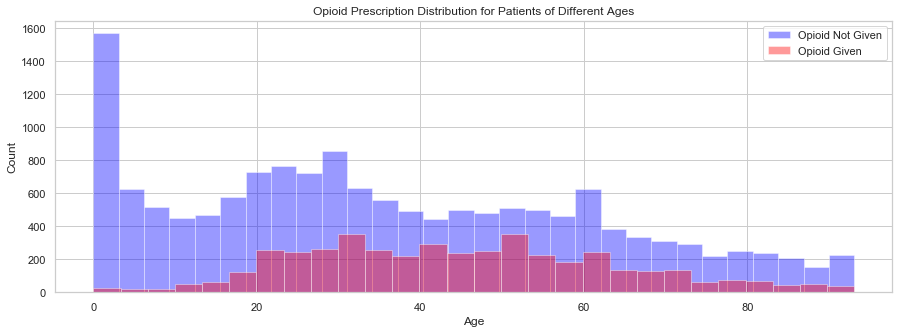

In [261]:
Opioid_Not_Given = small_df[small_df['OPIOID_PRES']==0]['AGE']
Opioid_Given = small_df[small_df['OPIOID_PRES']==1]['AGE']

sns.distplot(Opioid_Not_Given, color='blue', label='Opioid Not Given', kde = False)
sns.distplot(Opioid_Given, color='red', label='Opioid Given', kde = False)


plt.title("Opioid Prescription Distribution for Patients of Different Ages")
plt.xlabel('Age')
plt.ylabel('Count')

sns.set(style="whitegrid")
plt.legend(loc='upper right')
plt.rcParams['figure.figsize'] = [20, 15]

plt.show()

#Make y axis a percentage (normalized) - 100% (pain level/whether opioid given or not)
#Use race opioid given
#pain level vs opioid given
#two separate visuals
#age vs opioid given

In [148]:
small_df.isna().sum() 

AGE              0
SEX_Binary       0
race_num         0
immedr_num     679
TOTCHRON       243
PAINSCALE      616
OPIOID_PRES      0
dtype: int64

In [149]:
small_df_na = small_df.dropna()

In [150]:
small_df.shape

(19467, 7)

In [151]:
small_df_na.shape

(18420, 7)

In [152]:
features_sm = ['AGE', 'SEX_Binary', 'race_num', 'immedr_num', 'TOTCHRON', 'PAINSCALE']      

In [153]:
X_sm = small_df_na[features_sm]
y_sm = small_df_na['OPIOID_PRES']

In [154]:
# Split the data into a training set and a test set
X_train_sm, X_test_sm, y_train_sm, y_test_sm = train_test_split(X_sm, y_sm, test_size=0.10, random_state=42)

In [155]:
X_test_sm.shape

(1842, 6)

In [156]:
### Visualizations for logistic regression with wegihts for variables (other visualizations for output)

import sklearn.linear_model

# Create a logisitic regression model using scikit-learn
classifier = sklearn.linear_model.LogisticRegression()

# Train the Logistic regression classifier
classifier.fit(X_train_sm, y_train_sm)

# Use the trained classifier to make predictions on the test data
y_pred_sm = classifier.predict(X_test_sm)

# Print the accuracy (percentage of phishing websites correctly predicted)
accuracy = 100.0 * sklearn.metrics.accuracy_score(y_test_sm, y_pred_sm)
print("The accuracy of your Logistic regression on testing data is: " + str(accuracy))

The accuracy of your Logistic regression on testing data is: 78.06731813246472


/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [157]:
from sklearn.metrics import classification_report
print(classification_report(y_test_sm, y_pred_sm))

              precision    recall  f1-score   support

           0       0.79      0.97      0.87      1403
           1       0.66      0.17      0.27       439

    accuracy                           0.78      1842
   macro avg       0.72      0.57      0.57      1842
weighted avg       0.76      0.78      0.73      1842



In [158]:
# Create a decision tree classifier model using scikit-learn
dt_classifier = sklearn.tree.DecisionTreeClassifier()

# Train the decision tree classifier
dt_classifier.fit(X_train_sm, y_train_sm)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [159]:
# Use the trained classifier to make predictions on the test data
y_pred_sm = dt_classifier.predict(X_test_sm)

# Print the accuracy (percentage of phishing websites correctly predicted)
accuracy = 100.0 * sklearn.metrics.accuracy_score(y_test_sm, y_pred_sm)
print("The accuracy of your decision tree on testing data is: " + str(accuracy))

The accuracy of your decision tree on testing data is: 71.06406080347448


In [160]:
#pain 0-3
#4-6
#7-10
#3 categories - see how decision tree splits wiht these categories vs opioid prescription given
#One hot encode the categorical variables like immedr and racenum

In [161]:
import graphviz 

graphviz.Source(sklearn.tree.export_graphviz(dt_classifier,
                                             feature_names=features_sm,
                                             class_names=['OpioidNotPrescribed', 'OpioidPrescribed'],
                                             out_file=None,
                                             filled = True))